In [45]:
import pandas as pd
import numpy as np

In [46]:
df_AWS = pd.read_csv(
            'https://raw.githubusercontent.com/numenta/NAB/master/data/realKnownCause/ec2_request_latency_system_failure.csv',
                        )
df_TempFail = pd.read_csv(
                'https://raw.githubusercontent.com/numenta/NAB/master/data/realKnownCause/machine_temperature_system_failure.csv',
)
df_AmbTemp = pd.read_csv(
                'https://raw.githubusercontent.com/numenta/NAB/master/data/realKnownCause/ambient_temperature_system_failure.csv',
)
df_CPU = pd.read_csv(
                'https://raw.githubusercontent.com/numenta/NAB/master/data/realKnownCause/cpu_utilization_asg_misconfiguration.csv',
)

In [47]:
df = pd.DataFrame(df_AWS)
df2 = pd.DataFrame(df_TempFail)
df3 = pd.DataFrame(df_AmbTemp)
df4 = pd.DataFrame(df_CPU)

In [48]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df2['timestamp'] = pd.to_datetime(df2['timestamp'])
df3['timestamp'] = pd.to_datetime(df3['timestamp'])
df4['timestamp'] = pd.to_datetime(df4['timestamp'])

In [49]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

Fig = make_subplots(rows=4, cols=1,
                    subplot_titles=
                    ["Amazon East Coast AWS datacenter CPU usage",
                     'Temperature of an internal component of a large, industrial mahcine',
                     'Ambient temperature in an office',
                     'Amazon Web Services average CPU usage across a given cluster']
                   )

Fig.add_trace(go.Scatter(x=df['timestamp'], 
                        y=df['value'],
                        marker_color='rgb(87, 100, 255)'),
              row=1, col=1,
             )
Fig.add_trace(go.Scatter(x=df2['timestamp'], 
                        y=df2['value'], 
                        marker_color='rgb(87, 100, 255)'),
              row=2, col=1,
             )
Fig.add_trace(go.Scatter(x=df3['timestamp'],
                         y=df3['value'], 
                         marker_color='rgb(87, 100, 255)'),
              row=3, col=1
             )
Fig.add_trace(go.Scatter(x=df4['timestamp'],
                         y=df4['value'], 
                         marker_color='rgb(87, 100, 255)'),
              row=4, col=1
             )

Fig.update_layout(width = 800, height=1000, showlegend=False)

# PCA
For this exercise I will be doing some feature engineering for each data set. Once I have more than the two intial features (value and timestamp), I will then apply PCA to reduce the feature set and identify useful features from dimensionality reduction.

In [50]:
from sklearn import preprocessing
from sklearn.decomposition import PCA

In [51]:
def PCA_2(data):
    min_max_scaler = preprocessing.StandardScaler()
    np_scaled = min_max_scaler.fit_transform(data)
    data = pd.DataFrame(np_scaled)
    # reduce to 2 importants features
    pca = PCA(n_components=2)
    data = pca.fit_transform(data)
    # standardize these 2 new features
    min_max_scaler = preprocessing.StandardScaler()
    np_scaled = min_max_scaler.fit_transform(data)
    data = pd.DataFrame(np_scaled)
    return data

# Kmeans Clustering

In [52]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

In [53]:
def KmeansCluster(data):
    n_cluster = range(1, 20)
    kmeans = [KMeans(n_clusters=i).fit(data) for i in n_cluster]
    scores = [kmeans[i].score(data) for i in range(len(kmeans))]
    return kmeans, scores

In [54]:
def plot_elbow(scores, title):
    n_cluster = range(1,20)
    sns.lineplot(x=n_cluster, y=scores)
    sns.set_style("darkgrid")
    plt.xlabel('Number of Clusters')
    plt.ylabel('Kmeans Score')
    plt.title(str(title) + " Elbow Visual")
    return plt.show()

In [55]:
def assign_clusters(df, data, kmeans, cluster):
    df['Cluster'] = kmeans[cluster].predict(data)
    df['Principal_1'] = data[0]
    df['Principal_2'] = data[1]
    return df

In [56]:
def plotClusters(df, title):
    sns.scatterplot(x='Principal_1',
                    y='Principal_2',
                    data=df,
                    hue='Cluster',
                    palette="deep"
                   )
    plt.xlabel('Principal Feature 1')
    plt.ylabel('Principal Feature 2')
    plt.title(str(title) + ' Visual of the Clusters')
    return plt.show()

In [57]:
# Identify the distance between each point and it's cluster's centroid
def getDistanceByPoint(data, model):
    distance = []
    for i in range(0,len(data)):
        Xa = np.array(data.loc[i])
        Xb = model.cluster_centers_[model.labels_[i]-1]
        distance.append(np.linalg.norm(Xa-Xb))
        
    distance = pd.Series(distance)
    return distance

In [77]:
# The biggest distances are considered as anomaly
def assignKmeansAnamoly(df, data, kmeans, cluster, outliers_fraction):
    distance = getDistanceByPoint(data, kmeans[cluster])
    number_of_outliers = int(outliers_fraction*len(distance))
    threshold = distance.nlargest(number_of_outliers).min()
    # anomaly contain the anomaly result of Cluster (0:normal, 1:anomaly) given outlier fraction
    df['Anomaly_Kmeans'] = (distance >= threshold).astype(int)
    return df

In [59]:
def PlotClusterAnomaly(df, title):
    sns.scatterplot(x='Principal_1',
                    y='Principal_2',
                    data=df,hue="Anomaly_Kmeans",
                    palette="deep")
    plt.xlabel('Principal Feature 1')
    plt.ylabel('Principal Feature 2')
    plt.title(str(title) + ' Visual of the Clusters with Anomaly')
    plt.legend([],[], frameon=False)
    return plt.show()

In [81]:
def PlotKmeansAnamoly(df, title, outliers_fraction):
    a = df.loc[df['Anomaly_Kmeans'] == 1, ['timestamp', 'value']]

    fig, ax = plt.subplots()

    a = df.loc[df['Anomaly_Kmeans'] == 1, ['timestamp', 'value']] #anomaly

    ax.plot(df['timestamp'],
            df['value'],
            color='blue')
    ax.scatter(a['timestamp'],
               a['value'],
               color='red')
    plt.xlabel('Date')
    plt.setp(ax.get_xticklabels(), rotation=45)
    plt.title(str(title) + ' with K-Means Anomaly detection \n (Threhold = ' + str(outliers_fraction) + ')')
    return plt.show()

# Gaussian with Clusters

In [61]:
from sklearn.covariance import EllipticEnvelope
def GaussianModel(df_class):
    envelope =  EllipticEnvelope(contamination = outliers_fraction) 
    X_train = df_class.values.reshape(-1,1)
    envelope.fit(X_train)
    df_class = pd.DataFrame(df_class)
    df_class['deviation'] = envelope.decision_function(X_train)
    df_class['anomaly'] = envelope.predict(X_train)
    return df_class

In [62]:
def AddGaussAnomaly(df, df_class):
    df['Anomaly_Gaus'] = df_class['anomaly']
    df['Anomaly_Gaus'] = np.array(df['Anomaly_Gaus'] == -1).astype(int)
    return df

In [63]:
def plotGauss(df, title):
    a = df.loc[df['Anomaly_Gaus'] == 1,('timestamp', 'value')] #anomaly
    
    fig, ax = plt.subplots()
    ax.plot(df['timestamp'],
            df['value'],
            color='blue')
    ax.scatter(a['timestamp'],
               a['value'],
               color='red')
    plt.xlabel('Date')
    plt.setp(ax.get_xticklabels(), rotation=45)
    plt.title(str(title) + ' with Gaussian/Cluster detection \n (Threhold = 0.001)')
    return plt.show()

# Isolation Forest

In [170]:
from sklearn.ensemble import IsolationForest
# Take useful feature and standardize them 
def isolationForest(df, data, outliers_fraction):
    min_max_scaler = preprocessing.StandardScaler()
    np_scaled = min_max_scaler.fit_transform(data)
    data = pd.DataFrame(np_scaled)
    # train isolation forest 
    model =  IsolationForest(contamination = outliers_fraction)
    model.fit(data)
    # add the data to the main  
    df['Anomaly_IF'] = pd.Series(model.predict(data))
    df['Anomaly_IF'] = df['Anomaly_IF'].map( {1: 0, -1: 1} )
    return df

In [65]:
def plotIsolationForest(df, title):
    fig, ax = plt.subplots()

    a = df.loc[df['Anomaly_IF'] == 1, ['timestamp', 'value']] #anomaly

    ax.plot(df['timestamp'], df['value'], color='blue')
    ax.scatter(a['timestamp'],a['value'], color='red')
    plt.xlabel('Date')
    plt.setp(ax.get_xticklabels(), rotation=45)
    plt.title(str(title) + ' with Isolation Forest detection \n (Threhold = 0.001)')
    return plt.show()

# One Class SVM

In [66]:
from sklearn.svm import OneClassSVM

outliers_fraction = 0.001

def SVM(df, data):
    min_max_scaler = preprocessing.StandardScaler()
    np_scaled = min_max_scaler.fit_transform(data)
    # train one class SVM 
    model =  OneClassSVM(nu=0.95 * outliers_fraction) #nu=0.95 * outliers_fraction  + 0.05
    data = pd.DataFrame(np_scaled)
    model.fit(data)
    # add the data to the main  
    df['Anomaly_SVM'] = pd.Series(model.predict(data))
    df['Anomaly_SVM'] = df['Anomaly_SVM'].map( {1: 0, -1: 1} )
    return df

In [67]:
def plotSVM(df, title):
    fig, ax = plt.subplots()

    a = df.loc[df['Anomaly_SVM'] == 1, ['timestamp', 'value']] #anomaly

    ax.plot(df['timestamp'], df['value'], color='blue')
    ax.scatter(a['timestamp'],a['value'], color='red')
    plt.xlabel('Date')
    plt.setp(ax.get_xticklabels(), rotation=45)
    plt.title(str(title) + ' with SVM detection \n (Threhold = 0.001)')
    plt.show()

# Amazon East Coast AWS datacenter CPU usage
CPU usage data from a server in Amazon's East Coast datacenter. The dataset ends with complete system failure resulting from a documented failure of AWS API servers. 

## Kmeans Clustering

In [68]:
df['hours'] = df['timestamp'].dt.hour
df['Day'] = df['timestamp'].dt.dayofweek
df['min'] = df['timestamp'].dt.minute

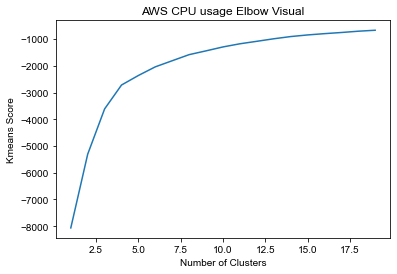

In [69]:
data = df[['value', 'hours', 'Day', 'min']]
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = 'AWS CPU usage')

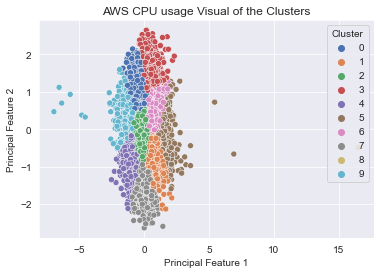

In [75]:
cluster = 9
df = assign_clusters(df, data, kmeans, cluster)
plotClusters(df, title = 'AWS CPU usage')

In [78]:
outliers_fraction = 0.001
df = assignKmeansAnamoly(df, data, kmeans, cluster, outliers_fraction)

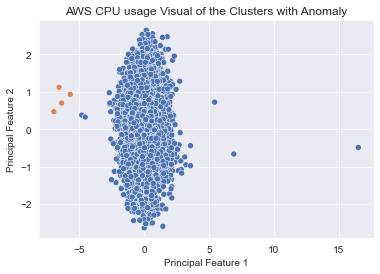

In [79]:
PlotClusterAnomaly(df, title = 'AWS CPU usage')

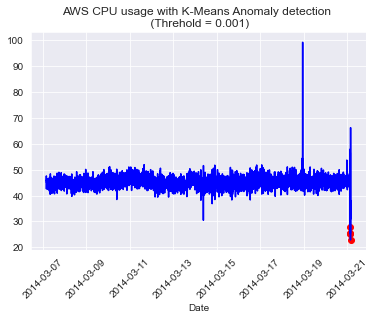

In [82]:
PlotKmeansAnamoly(df, title = 'AWS CPU usage', outliers_fraction = 0.001)

In [111]:
df['Anomaly_Kmeans'].value_counts()

0    4028
1       4
Name: Anomaly_Kmeans, dtype: int64

### Gaussian with Clusters

In [103]:
df_class0 = df.loc[df['Cluster'] == 0, 'value']
df_class1 = df.loc[df['Cluster'] == 1, 'value']
df_class2 = df.loc[df['Cluster'] == 2, 'value']
df_class3 = df.loc[df['Cluster'] == 3, 'value']
df_class4 = df.loc[df['Cluster'] == 4, 'value']
df_class5 = df.loc[df['Cluster'] == 5, 'value']
df_class6 = df.loc[df['Cluster'] == 6, 'value']
df_class7 = df.loc[df['Cluster'] == 7, 'value']

In [104]:
df_class0 = GaussianModel(df_class0)
df_class1 = GaussianModel(df_class1)
df_class2 = GaussianModel(df_class2)
df_class3 = GaussianModel(df_class3)
df_class4 = GaussianModel(df_class4)
df_class5 = GaussianModel(df_class5)
df_class6 = GaussianModel(df_class6)
df_class7 = GaussianModel(df_class7)

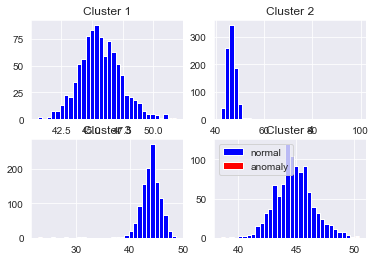

In [96]:
# plot the temperature repartition by categories with anomalies
a0 = df_class0.loc[df_class0['anomaly'] == 1, 'value']
b0 = df_class0.loc[df_class0['anomaly'] == -1, 'value']

a1 = df_class1.loc[df_class1['anomaly'] == 1, 'value']
b1 = df_class1.loc[df_class1['anomaly'] == -1, 'value']

a2 = df_class2.loc[df_class2['anomaly'] == 1, 'value']
b2 = df_class2.loc[df_class2['anomaly'] == -1, 'value']

a3 = df_class3.loc[df_class3['anomaly'] == 1, 'value']
b3 = df_class3.loc[df_class3['anomaly'] == -1, 'value']

fig, axs = plt.subplots(2,2)
axs[0,0].hist([a0,b0], bins=32, stacked=True, color=['blue', 'red'], label=['normal', 'anomaly'])
axs[0,1].hist([a1,b1], bins=32, stacked=True, color=['blue', 'red'], label=['normal', 'anomaly'])
axs[1,0].hist([a2,b2], bins=32, stacked=True, color=['blue', 'red'], label=['normal', 'anomaly'])
axs[1,1].hist([a3,b3], bins=32, stacked=True, color=['blue', 'red'], label=['normal', 'anomaly'])
axs[0,0].set_title("Cluster 1")
axs[0,1].set_title("Cluster 2")
axs[1,0].set_title("Cluster 3")
axs[1,1].set_title("Cluster 4")
plt.legend()
plt.show()

In [105]:
# add the data to the main 
df_class = pd.concat([df_class0, df_class1, df_class2, df_class3,df_class4, df_class5, df_class6, df_class7])
df = AddGaussAnomaly(df, df_class)

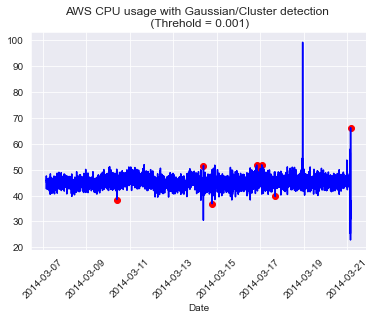

In [106]:
title = 'AWS CPU usage'
plotGauss(df, title)

In [109]:
df['Anomaly_Gaus'].value_counts()

0    4024
1       8
Name: Anomaly_Gaus, dtype: int64

### Isolation Forest

In [112]:
data = df[['value', 'hours', 'Day', 'min']]

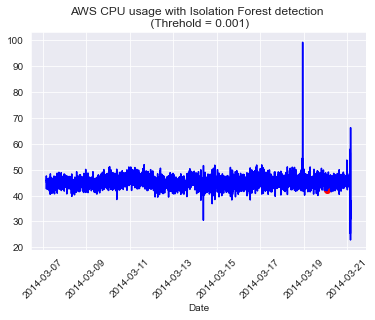

In [171]:
outliers_fraction=0.001
df = isolationForest(df, data, outliers_fraction)
title = 'AWS CPU usage'
plotIsolationForest(df, title)

In [172]:
df['Anomaly_IF'].value_counts()

0    4030
1       2
Name: Anomaly_IF, dtype: int64

### One Class SVM

In [116]:
data = df[['value', 'hours', 'Day', 'min']]
df = SVM(df, data)

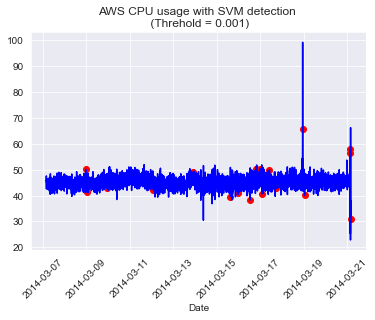

In [117]:
title = 'AWS CPU usage'
plotSVM(df, title)

In [118]:
df['Anomaly_SVM'].value_counts()

0    4006
1      26
Name: Anomaly_SVM, dtype: int64

### LSTM RNN

In [151]:
#select and standardize data
data_n = df[['value', 'hours', 'Day', 'min']]
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data_n)
data_n = pd.DataFrame(np_scaled)

# important parameters and train/test size
prediction_time = 1 
testdatasize = int(len(df['value'])*.3)
unroll_length = 50
testdatacut = testdatasize + unroll_length  + 1

#train data
x_train = data_n[0:-prediction_time-testdatacut]
y_train = data_n[prediction_time:-testdatacut ][0]

# test data
x_test = data_n[0-testdatacut:-prediction_time]
y_test = data_n[prediction_time-testdatacut:  ][0]

In [152]:
def unroll(data,sequence_length=24):
    result = []
    for index in range(len(data) - sequence_length):
        result.append(data[index: index + sequence_length])
    return np.asarray(result)

# adapt the datasets for the sequence data shape
x_train = unroll(x_train,unroll_length)
x_test  = unroll(x_test,unroll_length)
y_train = y_train[-x_train.shape[0]:]
y_test  = y_test[-x_test.shape[0]:]

In [153]:
print('X Train shape: ', x_train.shape)
print('Y Train shape: ', y_train.shape)
print('X Test shape: ', x_test.shape)
print('Y Test shape: ', y_test.shape)

X Train shape:  (2930, 50, 4)
Y Train shape:  (2930,)
X Test shape:  (1000, 50, 4)
Y Test shape:  (1000,)


In [154]:
input_shape = (x_train.shape[1], x_train.shape[2])
input_shape

(50, 4)

In [155]:
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.models import Sequential
import time #helper libraries
from keras.models import model_from_json
import sys

model = Sequential()

model.add(LSTM(units = 100, return_sequences = True, input_shape = input_shape))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = True))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = False))
model.add(Dropout(0.2))
model.add(Dense(units = 1))
model.add(Activation('linear'))

start = time.time()
model.compile(loss='mse', optimizer='adam')
print('compilation time : {}'.format(time.time() - start))

compilation time : 0.004988670349121094


In [156]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 50, 100)           42000     
_________________________________________________________________
dropout_3 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 50, 100)           80400     
_________________________________________________________________
dropout_4 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_5 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dropout_5 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                

In [157]:
model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=15,
)

Epoch 1/15
46/46 [==============================] - 10s 96ms/step - loss: 0.7129
Epoch 2/15
46/46 [==============================] - 5s 98ms/step - loss: 0.6173: 1s - 
Epoch 3/15
46/46 [==============================] - 4s 94ms/step - loss: 0.6289
Epoch 4/15
46/46 [==============================] - 5s 100ms/step - loss: 0.6307
Epoch 5/15
46/46 [==============================] - 5s 102ms/step - loss: 0.6148
Epoch 6/15
46/46 [==============================] - 5s 107ms/step - loss: 0.6232
Epoch 7/15
46/46 [==============================] - 5s 107ms/step - loss: 0.5886
Epoch 8/15
46/46 [==============================] - 5s 106ms/step - loss: 0.6370
Epoch 9/15
46/46 [==============================] - 5s 102ms/step - loss: 0.6302
Epoch 10/15
46/46 [==============================] - 5s 101ms/step - loss: 0.6174
Epoch 11/15
46/46 [==============================] - 5s 108ms/step - loss: 0.6599
Epoch 12/15
46/46 [==============================] - 5s 101ms/step - loss: 0.6420
Epoch 13/15
46/46 [=

In [158]:
y_test = y_test.reset_index().drop(columns=['index'])

In [159]:
# create the list of difference between prediction and test data
diff=[]
ratio=[]
p = model.predict(x_test)
prediction = []

for u in range(len(y_test)):
    pr = p[u][0]
    prediction.append(pr)
    actual = y_test[0][u]
    ratio.append((actual / pr ) - 1)
    diff.append(abs(actual - pr))

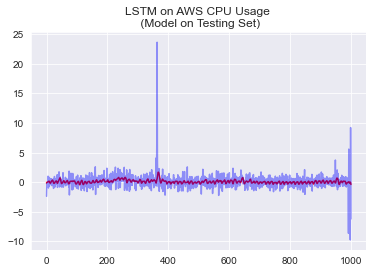

In [160]:
# plot the prediction and the reality (for the test data)
fig, axs = plt.subplots()
axs.plot(p,color='red', label='prediction')
axs.plot(y_test,color='blue', label='y_test', alpha=0.4)
axs.legend().set_visible(False)
plt.title('LSTM on AWS CPU Usage \n (Model on Testing Set)')
plt.show()

In [163]:
# select the most distant prediction/reality data points as anomalies
diff = pd.Series(diff)
outliers_fraction = 0.01
number_of_outliers = int(outliers_fraction*len(diff))
threshold = diff.nlargest(number_of_outliers).min()
# data with anomaly label (test data part)
test = (diff >= threshold).astype(int)
# the training data part where we didn't predict anything (overfitting possible): no anomaly
complement = pd.Series(0, index=np.arange(len(data_n)-testdatasize))
# # add the data to the main
df['anomaly27'] = complement.append(test, ignore_index='True')
print(df['anomaly27'].value_counts())

0    4022
1      10
Name: anomaly27, dtype: int64


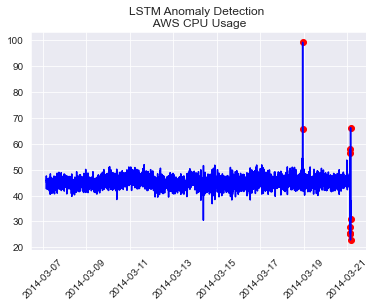

In [164]:
fig, ax = plt.subplots()

a = df.loc[df['anomaly27'] == 1, ['timestamp', 'value']] #anomaly

ax.plot(df['timestamp'], df['value'], color='blue')
ax.scatter(a['timestamp'],a['value'], color='red')
plt.title('LSTM Anomaly Detection \n AWS CPU Usage')
plt.setp(ax.get_xticklabels(), rotation=45)
plt.show()

# Temperature of an internal component of a large, industrial mahcine
Temperature sensor data of an internal component of a large, industrial mahcine. The first anomaly is a planned shutdown of the machine. The second anomaly is difficult to detect and directly led to the third anomaly, a catastrophic failure of the machine.

In [120]:
df2['hours'] = df2['timestamp'].dt.hour
df2['Day'] = df2['timestamp'].dt.dayofweek

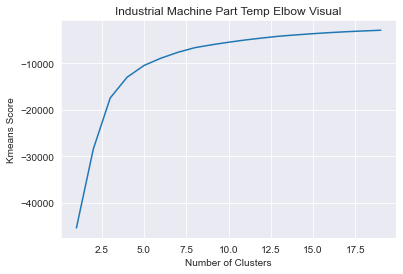

In [121]:
data = df2[['value', 'hours', 'Day']]
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = "Industrial Machine Part Temp")

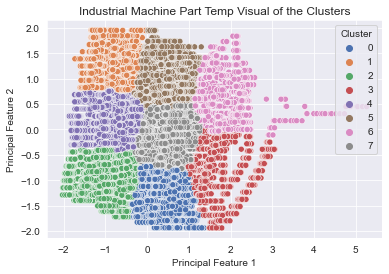

In [122]:
cluster = 7
df2 = assign_clusters(df2, data, kmeans, cluster)
plotClusters(df2, title = "Industrial Machine Part Temp")

In [123]:
outliers_fraction = 0.001
df2 = assignKmeansAnamoly(df2, data, kmeans, cluster, outliers_fraction)

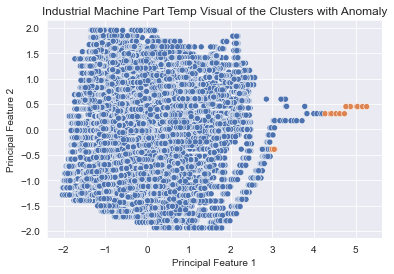

In [124]:
PlotClusterAnomaly(df2, title = "Industrial Machine Part Temp")

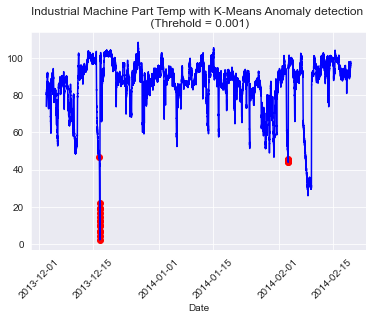

In [126]:
PlotKmeansAnamoly(df2, title = 'Industrial Machine Part Temp', outliers_fraction = 0.001)

In [128]:
df2['Anomaly_Kmeans'].value_counts()

0    22673
1       22
Name: Anomaly_Kmeans, dtype: int64

### Gaussian with Clusters

In [138]:
df_class0 = df2.loc[df2['Cluster'] == 0, 'value']
df_class1 = df2.loc[df2['Cluster'] == 1, 'value']
df_class2 = df2.loc[df2['Cluster'] == 2, 'value']
df_class3 = df2.loc[df2['Cluster'] == 3, 'value']
df_class4 = df2.loc[df2['Cluster'] == 4, 'value']
df_class5 = df2.loc[df2['Cluster'] == 5, 'value']
df_class6 = df2.loc[df2['Cluster'] == 6, 'value']
df_class7 = df2.loc[df2['Cluster'] == 7, 'value']


In [139]:
df_class0 = GaussianModel(df_class0)
df_class1 = GaussianModel(df_class1)
df_class2 = GaussianModel(df_class2)
df_class3 = GaussianModel(df_class3)
df_class4 = GaussianModel(df_class4)
df_class5 = GaussianModel(df_class5)
df_class6 = GaussianModel(df_class6)
df_class7 = GaussianModel(df_class7)

In [140]:
# add the data to the main 
df_class = pd.concat([df_class0, df_class1, df_class2, df_class3, df_class4, df_class5, df_class6, df_class7])
df2 = AddGaussAnomaly(df2, df_class)

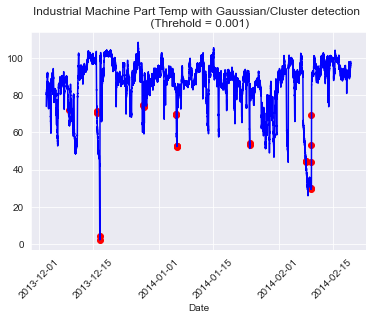

In [141]:
plotGauss(df2, title = "Industrial Machine Part Temp")

In [147]:
anomaly_count = df2['Anomaly_Gaus'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 28


### Isolation Forest

In [148]:
data = df2[['value', 'hours', 'Day']]

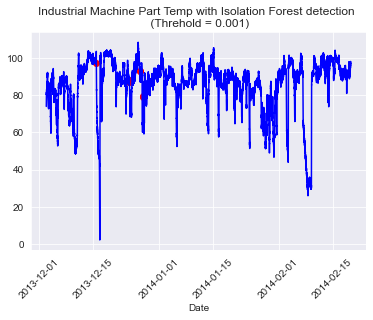

In [173]:
outliers_fraction=0.001
df2 = isolationForest(df2, data, outliers_fraction)
plotIsolationForest(df2, title = "Industrial Machine Part Temp")

In [174]:
anomaly_count = df2['Anomaly_IF'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 8


### One Class SVM

In [152]:
data = df2[['value', 'hours', 'Day']]
df2 = SVM(df2, data)

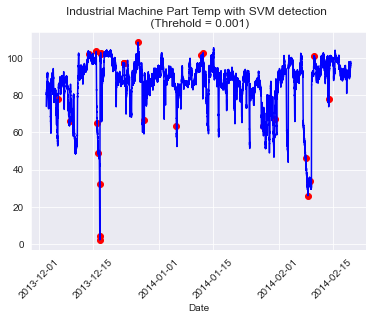

In [153]:
plotSVM(df2, title = "Industrial Machine Part Temp")

In [154]:
anomaly_count = df2['Anomaly_SVM'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 29


### LSTM RNN

In [166]:
#select and standardize data
data_n = df2[['value', 'hours', 'Day']]
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data_n)
data_n = pd.DataFrame(np_scaled)

# important parameters and train/test size
prediction_time = 1 
testdatasize = int(len(df2['value'])*.3)
unroll_length = 50
testdatacut = testdatasize + unroll_length  + 1

#train data
x_train = data_n[0:-prediction_time-testdatacut]
y_train = data_n[prediction_time:-testdatacut ][0]

# test data
x_test = data_n[0-testdatacut:-prediction_time]
y_test = data_n[prediction_time-testdatacut:  ][0]

In [167]:
def unroll(data,sequence_length=24):
    result = []
    for index in range(len(data) - sequence_length):
        result.append(data[index: index + sequence_length])
    return np.asarray(result)

# adapt the datasets for the sequence data shape
x_train = unroll(x_train,unroll_length)
x_test  = unroll(x_test,unroll_length)
y_train = y_train[-x_train.shape[0]:]
y_test  = y_test[-x_test.shape[0]:]

In [168]:
print('X Train shape: ', x_train.shape)
print('Y Train shape: ', y_train.shape)
print('X Test shape: ', x_test.shape)
print('Y Test shape: ', y_test.shape)

X Train shape:  (21593, 50, 3)
Y Train shape:  (21593,)
X Test shape:  (1000, 50, 3)
Y Test shape:  (1000,)


In [169]:
input_shape = (x_train.shape[1], x_train.shape[2])
input_shape

(50, 3)

In [170]:
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.models import Sequential
import time #helper libraries
from keras.models import model_from_json
import sys

model = Sequential()

model.add(LSTM(units = 100, return_sequences = True, input_shape = input_shape))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = True))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = False))
model.add(Dropout(0.2))
model.add(Dense(units = 1))
model.add(Activation('linear'))

start = time.time()
model.compile(loss='mse', optimizer='adam')
print('compilation time : {}'.format(time.time() - start))

compilation time : 0.004987001419067383


In [171]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 50, 100)           41600     
_________________________________________________________________
dropout_6 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_7 (LSTM)                (None, 50, 100)           80400     
_________________________________________________________________
dropout_7 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_8 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dropout_8 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                

In [172]:
model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=15,
)

Epoch 1/15
338/338 [==============================] - 39s 102ms/step - loss: 0.1032
Epoch 2/15
338/338 [==============================] - 34s 100ms/step - loss: 0.0262
Epoch 3/15
338/338 [==============================] - 35s 104ms/step - loss: 0.0214
Epoch 4/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0193
Epoch 5/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0180
Epoch 6/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0155
Epoch 7/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0139
Epoch 8/15
338/338 [==============================] - 34s 102ms/step - loss: 0.0143
Epoch 9/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0144
Epoch 10/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0146
Epoch 11/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0149
Epoch 12/15
338/338 [==============================] - 34s 101ms/step - lo

In [173]:
y_test = y_test.reset_index().drop(columns=['index'])

In [174]:
# create the list of difference between prediction and test data
diff=[]
ratio=[]
p = model.predict(x_test)
prediction = []

for u in range(len(y_test)):
    pr = p[u][0]
    prediction.append(pr)
    actual = y_test[0][u]
    ratio.append((actual / pr ) - 1)
    diff.append(abs(actual - pr))

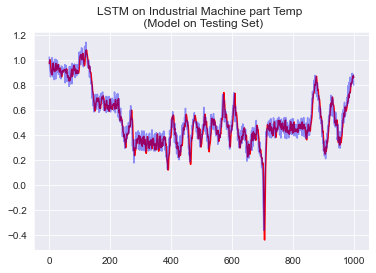

In [175]:
# plot the prediction and the reality (for the test data)
fig, axs = plt.subplots()
axs.plot(p,color='red', label='prediction')
axs.plot(y_test,color='blue', label='y_test', alpha=0.4)
axs.legend().set_visible(False)
plt.title('LSTM on Industrial Machine part Temp \n (Model on Testing Set)')
plt.show()

In [180]:
# select the most distant prediction/reality data points as anomalies
diff = pd.Series(diff)
outliers_fraction = 0.01
number_of_outliers = int(outliers_fraction*len(diff))
threshold = diff.nlargest(number_of_outliers).min()
# data with anomaly label (test data part)
test = (diff >= threshold).astype(int)
# the training data part where we didn't predict anything (overfitting possible): no anomaly
complement = pd.Series(0, index=np.arange(len(data_n)-testdatasize))
# # add the data to the main
df2['anomaly27'] = complement.append(test, ignore_index='True')
print(df2['anomaly27'].value_counts())

0    22685
1       10
Name: anomaly27, dtype: int64


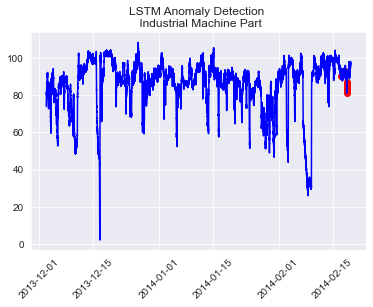

In [181]:
fig, ax = plt.subplots()

a = df2.loc[df2['anomaly27'] == 1, ['timestamp', 'value']] #anomaly

ax.plot(df2['timestamp'], df2['value'], color='blue')
ax.scatter(a['timestamp'],a['value'], color='red')
plt.title('LSTM Anomaly Detection \n Industrial Machine Part')
plt.setp(ax.get_xticklabels(), rotation=45)
plt.show()

# Ambient temperature in an office
The ambient temperature in an office setting.

**Feature engineering**

Useful information about an office space would be day of the week and whether there is anyone in the office (working hours).
We can extract those features from the date/time column and create new columns with this data.

In [156]:
df3['hours'] = df3['timestamp'].dt.hour
df3['WorkHours'] = ((df3['hours'] >= 7) & (df3['hours'] <= 20)).astype(int)
df3['Day'] = df3['timestamp'].dt.dayofweek
df3['WeekDay'] = (df3['Day'] < 5).astype(int)

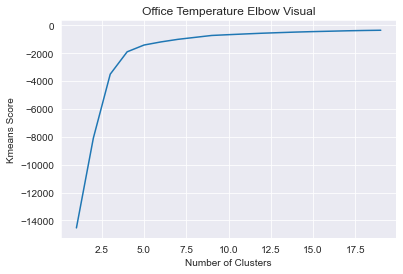

In [157]:
data = df3[['value', 'hours', 'WorkHours', 'Day', 'WeekDay']]
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = "Office Temperature")

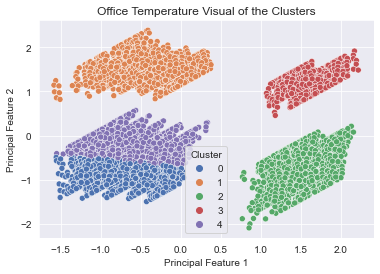

In [158]:
cluster = 4
df3 = assign_clusters(df3, data, kmeans, cluster)
plotClusters(df3, title = "Office Temperature")

In [159]:
outliers_fraction=0.001
df3 = assignKmeansAnamoly(df3, data, kmeans, cluster, outliers_fraction)

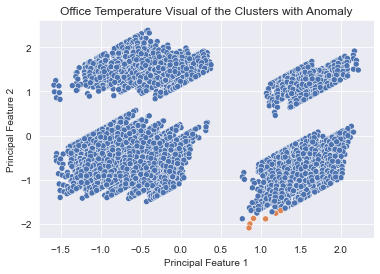

In [160]:
PlotClusterAnomaly(df3, title = "Office Temperature")

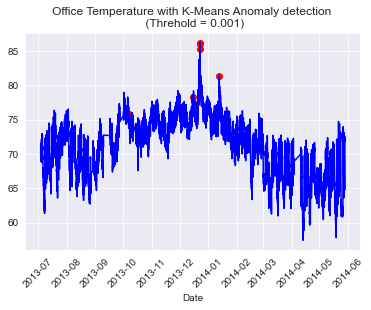

In [162]:
PlotKmeansAnamoly(df3, title = 'Office Temperature', outliers_fraction = 0.001)

In [164]:
anomaly_count = df3['Anomaly_Kmeans'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 7


In [ ]:
Working = df3[(df3['WorkHours'] == 1) & (df3['WeekDay'] == 1)]
NotWorking = df3[(df3['WorkHours'] == 0) | (df3['WeekDay'] == 0)]

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
a_heights, a_bins = np.histogram(Working['value'])
b_heights, b_bins = np.histogram(NotWorking['value'], bins=a_bins)
width = (a_bins[1] - a_bins[0])/2.5

ax.bar(a_bins[:-1], 
       a_heights*100/Working['value'].count(),
       width=width,
       facecolor='blue',
       label='Working Hours')
ax.bar(b_bins[:-1]+width,
       (b_heights*100/NotWorking['value'].count()),
       width=width,
       facecolor='green',
       label ='Non Working Hours')
plt.legend()
plt.show()

### Gaussian with Clusters

In [165]:
df_class0 = df3.loc[df3['Cluster'] == 0, 'value']
df_class1 = df3.loc[df3['Cluster'] == 1, 'value']
df_class2 = df3.loc[df3['Cluster'] == 2, 'value']
df_class3 = df3.loc[df3['Cluster'] == 3, 'value']
df_class4 = df3.loc[df3['Cluster'] == 4, 'value']

In [166]:
df_class0 = GaussianModel(df_class0)
df_class1 = GaussianModel(df_class1)
df_class2 = GaussianModel(df_class2)
df_class3 = GaussianModel(df_class3)
df_class4 = GaussianModel(df_class4)

In [167]:
# add the data to the main 
df_class = pd.concat([df_class0, df_class1, df_class2, df_class3, df_class4])
df3 = AddGaussAnomaly(df3, df_class)

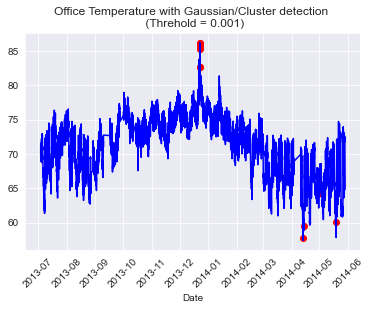

In [168]:
plotGauss(df3, title = "Office Temperature")

In [169]:
anomaly_count = df3['Anomaly_Gaus'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 10


### Isolation Forest

In [363]:
data = df3[['value', 'hours', 'WorkHours', 'Day', 'WeekDay']]

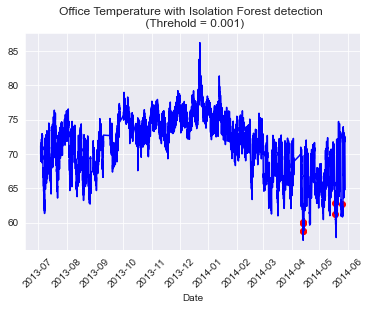

In [175]:
outliers_fraction=0.001
df2 = isolationForest(df3, data, outliers_fraction)
plotIsolationForest(df3, title = "Office Temperature")

In [176]:
anomaly_count = df3['Anomaly_IF'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 8


### One Class SVM

In [186]:
data = df3[['value', 'hours', 'WorkHours', 'Day', 'WeekDay']]
df3 = SVM(df3, data)

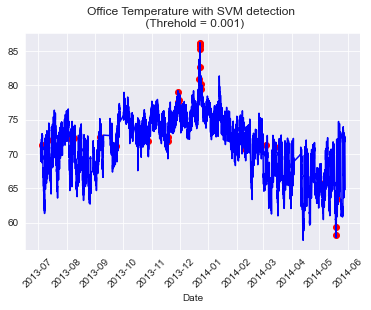

In [187]:
plotSVM(df3, title = "Office Temperature")

In [188]:
anomaly_count = df3['Anomaly_SVM'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 36


### LSTM RNN

In [187]:
#select and standardize data
data_n = df3[['value', 'hours', 'WorkHours', 'Day', 'WeekDay']]
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data_n)
data_n = pd.DataFrame(np_scaled)

# important parameters and train/test size
prediction_time = 1 
testdatasize = int(len(df3['value'])*.3)
unroll_length = 50
testdatacut = testdatasize + unroll_length  + 1

#train data
x_train = data_n[0:-prediction_time-testdatacut]
y_train = data_n[prediction_time:-testdatacut ][0]

# test data
x_test = data_n[0-testdatacut:-prediction_time]
y_test = data_n[prediction_time-testdatacut:  ][0]

In [188]:
def unroll(data,sequence_length=24):
    result = []
    for index in range(len(data) - sequence_length):
        result.append(data[index: index + sequence_length])
    return np.asarray(result)

# adapt the datasets for the sequence data shape
x_train = unroll(x_train,unroll_length)
x_test  = unroll(x_test,unroll_length)
y_train = y_train[-x_train.shape[0]:]
y_test  = y_test[-x_test.shape[0]:]

In [189]:
print('X Train shape: ', x_train.shape)
print('Y Train shape: ', y_train.shape)
print('X Test shape: ', x_test.shape)
print('Y Test shape: ', y_test.shape)

X Train shape:  (4985, 50, 5)
Y Train shape:  (4985,)
X Test shape:  (2180, 50, 5)
Y Test shape:  (2180,)


In [190]:
input_shape = (x_train.shape[1], x_train.shape[2])
input_shape

(50, 5)

In [191]:
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.models import Sequential
import time #helper libraries
from keras.models import model_from_json
import sys

model = Sequential()

model.add(LSTM(units = 100, return_sequences = True, input_shape = input_shape))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = True))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = False))
model.add(Dropout(0.2))
model.add(Dense(units = 1))
model.add(Activation('linear'))

start = time.time()
model.compile(loss='mse', optimizer='adam')
print('compilation time : {}'.format(time.time() - start))

compilation time : 0.006981849670410156


In [192]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 50, 100)           42400     
_________________________________________________________________
dropout_9 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_10 (LSTM)               (None, 50, 100)           80400     
_________________________________________________________________
dropout_10 (Dropout)         (None, 50, 100)           0         
_________________________________________________________________
lstm_11 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dropout_11 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                

In [193]:
model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=15,
)

Epoch 1/15
78/78 [==============================] - 96s 103ms/step - loss: 0.1993
Epoch 2/15
78/78 [==============================] - 9s 113ms/step - loss: 0.0629
Epoch 3/15
78/78 [==============================] - 8s 107ms/step - loss: 0.0592
Epoch 4/15
78/78 [==============================] - 8s 107ms/step - loss: 0.0555
Epoch 5/15
78/78 [==============================] - 8s 105ms/step - loss: 0.0562
Epoch 6/15
78/78 [==============================] - 8s 107ms/step - loss: 0.0479
Epoch 7/15
78/78 [==============================] - 8s 105ms/step - loss: 0.0499
Epoch 8/15
78/78 [==============================] - 8s 107ms/step - loss: 0.0481
Epoch 9/15
78/78 [==============================] - 8s 105ms/step - loss: 0.0459
Epoch 10/15
78/78 [==============================] - 9s 113ms/step - loss: 0.0463
Epoch 11/15
78/78 [==============================] - 8s 104ms/step - loss: 0.0439
Epoch 12/15
78/78 [==============================] - 8s 109ms/step - loss: 0.0452
Epoch 13/15
78/78 [=====

In [195]:
p = model.predict(x_test)

In [198]:
y_test = y_test.reset_index().drop(columns=['index'])

In [205]:
y_test[0][0]

0.22875578417364123

In [206]:
# create the list of difference between prediction and test data
diff=[]
ratio=[]
p = model.predict(x_test)

for u in range(len(y_test)):
    pr = p[u][0]
    actual = y_test[0][u]
    ratio.append((actual / pr ) - 1)
    diff.append(abs(actual - pr))

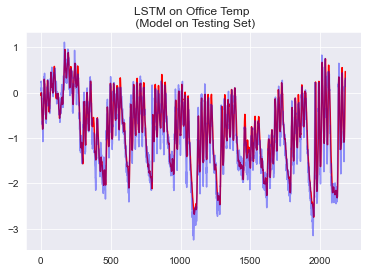

In [210]:
# plot the prediction and the reality (for the test data)
fig, axs = plt.subplots()
axs.plot(p,color='red', label='prediction')
axs.plot(y_test,color='blue', label='y_test', alpha = 0.4)
axs.legend().set_visible(False)
plt.title('LSTM on Office Temp \n (Model on Testing Set)')
plt.show()

In [214]:
# select the most distant prediction/reality data points as anomalies
outliers_fraction = 0.01
diff = pd.Series(diff)
number_of_outliers = int(outliers_fraction*len(diff))
threshold = diff.nlargest(number_of_outliers).min()
# data with anomaly label (test data part)
test = (diff >= threshold).astype(int)
# the training data part where we didn't predict anything (overfitting possible): no anomaly
complement = pd.Series(0, index=np.arange(len(data_n)-testdatasize))
# # add the data to the main
df3['anomaly27'] = complement.append(test, ignore_index='True')
print(df3['anomaly27'].value_counts())

0    7246
1      21
Name: anomaly27, dtype: int64


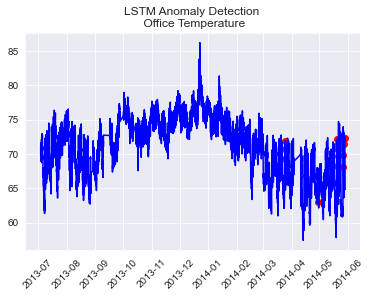

In [215]:
fig, ax = plt.subplots()

a = df3.loc[df3['anomaly27'] == 1, ['timestamp', 'value']] #anomaly

ax.plot(df3['timestamp'], df3['value'], color='blue')
ax.scatter(a['timestamp'],a['value'], color='red')
plt.title('LSTM Anomaly Detection \n Office Temperature')
plt.setp(ax.get_xticklabels(), rotation=45)
plt.show()

# Amazon Web Services average CPU usage across a given cluster
From Amazon Web Services (AWS) monitoring CPU usage – i.e. average CPU usage across a given cluster. When usage is high, AWS spins up a new machine, and uses fewer machines when usage is low.

In [189]:
df4['hours'] = df4['timestamp'].dt.hour
df4['Day'] = df4['timestamp'].dt.dayofweek
df4['WeekDay'] = (df4['Day'] < 5).astype(int)

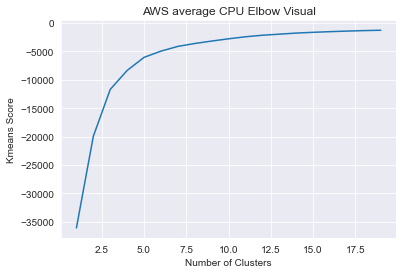

In [190]:
data = df4[['value', 'hours', 'Day', 'WeekDay']]
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = "AWS average CPU")

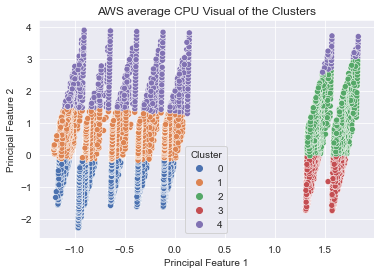

In [191]:
cluster = 4
df4 = assign_clusters(df4, data, kmeans, cluster)
plotClusters(df4, title = "AWS average CPU")

In [193]:
outliers_fraction = 0.001
df4 = assignKmeansAnamoly(df4, data, kmeans, cluster, outliers_fraction)

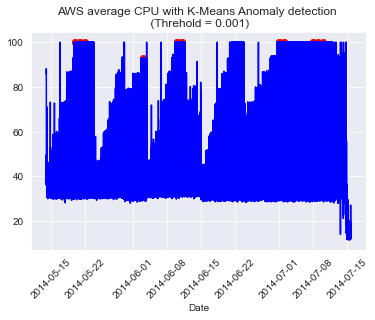

In [196]:
PlotKmeansAnamoly(df4, title = 'AWS average CPU', outliers_fraction = 0.001)

In [201]:
anomaly_count = df4['Anomaly_Kmeans'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 19


### Gaussian with Clusters

In [202]:
df_class0 = df4.loc[df4['Cluster'] == 0, 'value']
df_class1 = df4.loc[df4['Cluster'] == 1, 'value']
df_class2 = df4.loc[df4['Cluster'] == 2, 'value']
df_class3 = df4.loc[df4['Cluster'] == 3, 'value']
df_class4 = df4.loc[df4['Cluster'] == 4, 'value']


In [203]:
df_class0 = GaussianModel(df_class0)
df_class1 = GaussianModel(df_class1)
df_class2 = GaussianModel(df_class2)
df_class3 = GaussianModel(df_class3)
df_class4 = GaussianModel(df_class4)

In [204]:
# add the data to the main 
df_class = pd.concat([df_class0, df_class1, df_class2, df_class3, df_class4])
df4 = AddGaussAnomaly(df4, df_class)

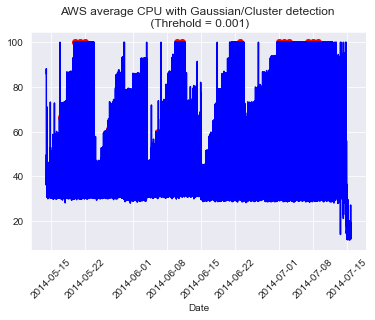

In [205]:
plotGauss(df4, title = "AWS average CPU")

In [206]:
anomaly_count = df4['Anomaly_Gaus'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 23


### Isolation Forest

In [377]:
data = df4[['value', 'hours', 'Day', 'WeekDay']]

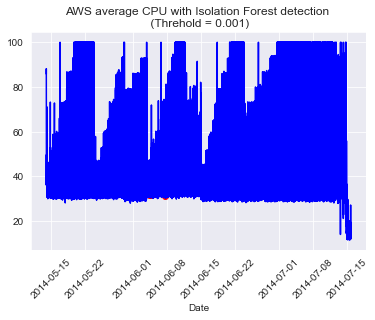

In [177]:
outliers_fraction=0.001
df4 = isolationForest(df4, data, outliers_fraction)
plotIsolationForest(df4, title = "AWS average CPU")

In [180]:
anomaly_count = df4['Anomaly_IF'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 8


### One Class SVM

In [183]:
data = df4[['value', 'hours', 'Day', 'WeekDay']]
df4 = SVM(df4, data)

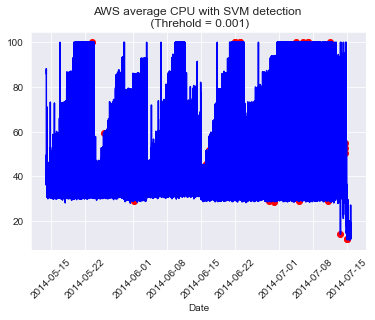

In [184]:
plotSVM(df4, title = "AWS average CPU")

In [185]:
anomaly_count = df4['Anomaly_SVM'].value_counts()[1]
print('Total anomalies detected: ' + str(anomaly_count))

Total anomalies detected: 48


### LSTM RNN

In [217]:
#select and standardize data
data_n = df4[['value', 'hours', 'Day', 'WeekDay']]
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data_n)
data_n = pd.DataFrame(np_scaled)

# important parameters and train/test size
prediction_time = 1 
testdatasize = int(len(df4['value']) * .3)
unroll_length = 50
testdatacut = testdatasize + unroll_length  + 1

#train data
x_train = data_n[0:-prediction_time-testdatacut]
y_train = data_n[prediction_time:-testdatacut ][0]

# test data
x_test = data_n[0-testdatacut:-prediction_time]
y_test = data_n[prediction_time-testdatacut:  ][0]

In [218]:
def unroll(data,sequence_length=24):
    result = []
    for index in range(len(data) - sequence_length):
        result.append(data[index: index + sequence_length])
    return np.asarray(result)

# adapt the datasets for the sequence data shape
x_train = unroll(x_train,unroll_length)
x_test  = unroll(x_test,unroll_length)
y_train = y_train[-x_train.shape[0]:]
y_test  = y_test[-x_test.shape[0]:]

In [219]:
print('X Train shape: ', x_train.shape)
print('Y Train shape: ', y_train.shape)
print('X Test shape: ', x_test.shape)
print('Y Test shape: ', y_test.shape)

X Train shape:  (12533, 50, 4)
Y Train shape:  (12533,)
X Test shape:  (5415, 50, 4)
Y Test shape:  (5415,)


In [220]:
input_shape = (x_train.shape[1], x_train.shape[2])
input_shape

(50, 4)

In [221]:
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.models import Sequential
import time #helper libraries
from keras.models import model_from_json
import sys

model = Sequential()

model.add(LSTM(units = 100, return_sequences = True, input_shape = input_shape))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = True))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = False))
model.add(Dropout(0.2))
model.add(Dense(units = 1))
model.add(Activation('linear'))

start = time.time()
model.compile(loss='mse', optimizer='adam')
print('compilation time : {}'.format(time.time() - start))

compilation time : 0.0049877166748046875


In [222]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 50, 100)           42000     
_________________________________________________________________
dropout_12 (Dropout)         (None, 50, 100)           0         
_________________________________________________________________
lstm_13 (LSTM)               (None, 50, 100)           80400     
_________________________________________________________________
dropout_13 (Dropout)         (None, 50, 100)           0         
_________________________________________________________________
lstm_14 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dropout_14 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                

In [223]:
model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=15,
)

Epoch 1/15
196/196 [==============================] - 23s 94ms/step - loss: 0.6567
Epoch 2/15
196/196 [==============================] - 20s 103ms/step - loss: 0.1863
Epoch 3/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1532
Epoch 4/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1342
Epoch 5/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1199
Epoch 6/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1075
Epoch 7/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1112
Epoch 8/15
196/196 [==============================] - 20s 101ms/step - loss: 0.1122
Epoch 9/15
196/196 [==============================] - 20s 102ms/step - loss: 0.0970
Epoch 10/15
196/196 [==============================] - 20s 104ms/step - loss: 0.1032
Epoch 11/15
196/196 [==============================] - 21s 105ms/step - loss: 0.0958
Epoch 12/15
196/196 [==============================] - 20s 102ms/step - loss: 0.

In [224]:
y_test = y_test.reset_index().drop(columns=['index'])

In [225]:
# create the list of difference between prediction and test data
diff=[]
ratio=[]
p = model.predict(x_test)
prediction = []

for u in range(len(y_test)):
    pr = p[u][0]
    prediction.append(pr)
    actual = y_test[0][u]
    ratio.append((actual / pr ) - 1)
    diff.append(abs(actual - pr))

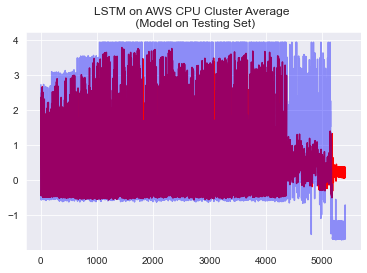

In [226]:
# plot the prediction and the reality (for the test data)
fig, axs = plt.subplots()
axs.plot(p,color='red', label='prediction')
axs.plot(y_test,color='blue', label='y_test', alpha=0.4)
axs.legend().set_visible(False)
plt.title('LSTM on AWS CPU Cluster Average \n (Model on Testing Set)')
plt.show()

In [229]:
# select the most distant prediction/reality data points as anomalies
diff = pd.Series(diff)
outliers_fraction = 0.01
number_of_outliers = int(outliers_fraction*len(diff))
threshold = diff.nlargest(number_of_outliers).min()
# data with anomaly label (test data part)
test = (diff >= threshold).astype(int)
# the training data part where we didn't predict anything (overfitting possible): no anomaly
complement = pd.Series(0, index=np.arange(len(data_n)-testdatasize))
# # add the data to the main
df4['anomaly27'] = complement.append(test, ignore_index='True')
print(df4['anomaly27'].value_counts())

0    17996
1       54
Name: anomaly27, dtype: int64


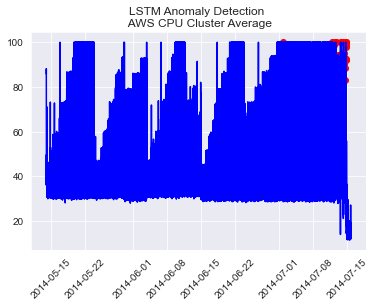

In [230]:
fig, ax = plt.subplots()

a = df4.loc[df4['anomaly27'] == 1, ['timestamp', 'value']] #anomaly

ax.plot(df4['timestamp'], df4['value'], color='blue')
ax.scatter(a['timestamp'],a['value'], color='red')
plt.title('LSTM Anomaly Detection \n AWS CPU Cluster Average')
plt.setp(ax.get_xticklabels(), rotation=45)
plt.show()

# Credit Fraud Dataset

## Unsupervised methods

In [9]:
dfcc = pd.read_csv('C:/Users/Damien/Desktop/Aquis/Resources/creditcardfraud_normalised.csv')

In [10]:
dfcc.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,class
0,0.935192,0.766490,0.881365,0.313023,0.763439,0.267669,0.266815,0.786444,0.475312,0.510600,...,0.561184,0.522992,0.663793,0.391253,0.585122,0.394557,0.418976,0.312697,0.005824,0
1,0.978542,0.770067,0.840298,0.271796,0.766120,0.262192,0.264875,0.786298,0.453981,0.505267,...,0.557840,0.480237,0.666938,0.336440,0.587290,0.446013,0.416345,0.313423,0.000105,0
2,0.935217,0.753118,0.868141,0.268766,0.762329,0.281122,0.270177,0.788042,0.410603,0.513018,...,0.565477,0.546030,0.678939,0.289354,0.559515,0.402727,0.415489,0.311911,0.014739,0
3,0.941878,0.765304,0.868484,0.213661,0.765647,0.275559,0.266803,0.789434,0.414999,0.507585,...,0.559734,0.510277,0.662607,0.223826,0.614245,0.389197,0.417669,0.314371,0.004807,0
4,0.938617,0.776520,0.864251,0.269796,0.762975,0.263984,0.268968,0.782484,0.490950,0.524303,...,0.561327,0.547271,0.663392,0.401270,0.566343,0.507497,0.420561,0.317490,0.002724,0


In [11]:
X = dfcc.drop('class', axis=1)
Y = dfcc['class']

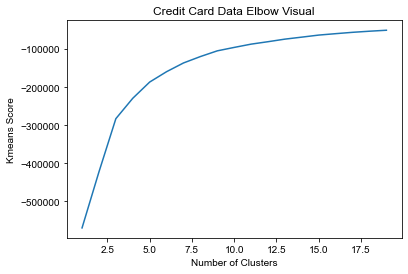

In [34]:
data = X
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = "Credit Card Data")

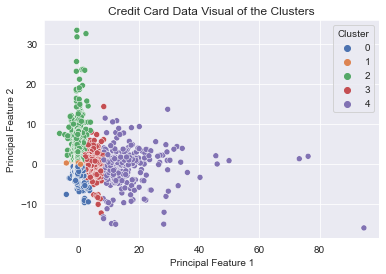

In [35]:
cluster = 4
dfcc = assign_clusters(dfcc, data, kmeans, cluster)
plotClusters(dfcc, title = "Credit Card Data")

In [36]:
dfcc = assignKmeansAnamoly(dfcc, data, kmeans, cluster)

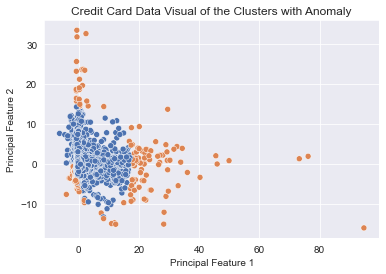

In [37]:
PlotClusterAnomaly(dfcc, title = "Credit Card Data")

In [38]:
dfcc['Anomaly_Kmeans'].unique()

array([0, 1])

In [39]:
Kmeans_TP = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_Kmeans'] == 1)].shape[0]
Kmeans_TN = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_Kmeans'] == 0)].shape[0]
Kmeans_FP = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_Kmeans'] == 1)].shape[0]
Kmeans_FN = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_Kmeans'] == 0)].shape[0]
print('K-means (5 Clusters) True Positive: ', Kmeans_TP)
print('K-means (5 Clusters) True Negative: ', Kmeans_TN)
print('K-means (5 Clusters) False Positive: ', Kmeans_FP)
print('K-means (5 Clusters) False Negative: ', Kmeans_FN)

K-means (5 Clusters) True Positive:  20
K-means (5 Clusters) True Negative:  284051
K-means (5 Clusters) False Positive:  264
K-means (5 Clusters) False Negative:  472


In [49]:
def plot_confusion(TN, FP, FN, TP, title):
    confusion_mat = [[TN, FP], [FN, TP]]
    ax = sns.heatmap(confusion_mat, annot=True, fmt='d', cmap="YlGnBu", cbar=False)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title("Confusion Matrix \n" + title)
    ax.set_xticklabels(['No Fraud', 'Fraud'])
    ax.set_yticklabels(['No Fraud', 'Fraud'])
    return plt.show()

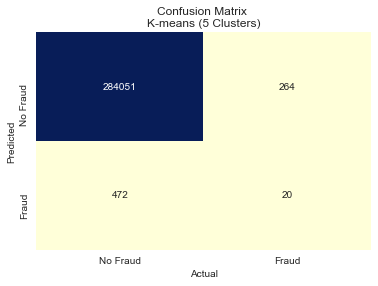

In [50]:
plot_confusion(Kmeans_TN,Kmeans_FP,Kmeans_FN,Kmeans_TP, title='K-means (5 Clusters)')

In [51]:
data = X
dfcc = isolationForest(dfcc, data)

In [52]:
IF_TP = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_IF'] == 1)].shape[0]
IF_TN = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_IF'] == 0)].shape[0]
IF_FP = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_IF'] == 1)].shape[0]
IF_FN = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_IF'] == 0)].shape[0]
print('Isolation Forest True Positive: ', IF_TP)
print('Isolation Forest True Negative: ', IF_TN)
print('Isolation Forest False Positive: ', IF_FP)
print('Isolation Forest False Negative: ', IF_FN)

Isolation Forest True Positive:  86
Isolation Forest True Negative:  284116
Isolation Forest False Positive:  199
Isolation Forest False Negative:  406


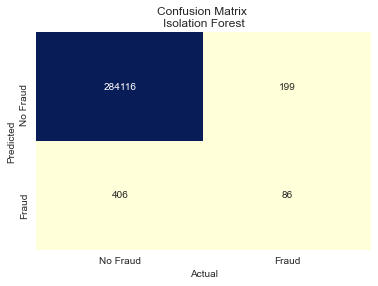

In [53]:
plot_confusion(IF_TN,IF_FP,IF_FN,IF_TP, title='Isolation Forest')

In [54]:
data = X
dfcc = SVM(dfcc, data)

In [55]:
SVM_TP = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_SVM'] == 1)].shape[0]
SVM_TN = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_SVM'] == 0)].shape[0]
SVM_FP = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_SVM'] == 1)].shape[0]
SVM_FN = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_SVM'] == 0)].shape[0]
print('SVM True Positive: ', SVM_TP)
print('SVM True Negative: ', SVM_TN)
print('SVM False Positive: ', SVM_FP)
print('SVM False Negative: ', SVM_FN)

SVM True Positive:  110
SVM True Negative:  282869
SVM False Positive:  1446
SVM False Negative:  382


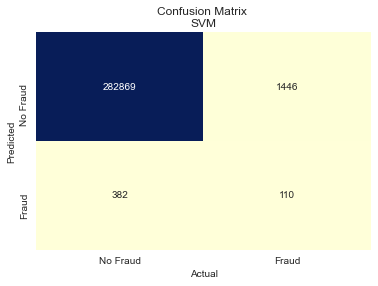

In [56]:
plot_confusion(SVM_TN,SVM_FP,SVM_FN,SVM_TP, title='SVM')

[Text(0, 0.5, 'No Fraud'), Text(0, 1.5, 'Fraud')]

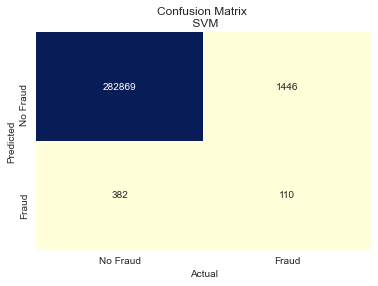

In [207]:
SVM_confusion = [[SVM_TN,SVM_FP], [SVM_FN ,SVM_TP]]
ax = sns.heatmap(SVM_confusion, annot=True, fmt='d', cmap="YlGnBu", cbar=False)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title("Confusion Matrix \n SVM")
ax.set_xticklabels(['No Fraud', 'Fraud'])
ax.set_yticklabels(['No Fraud', 'Fraud'])

In [57]:
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=3, min_samples=2).fit(X)

MemoryError: 

In [ ]:
clustering.labels_

## Supervised modeling

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [14]:
X_train = X_train.values
X_test = X_test.values
y_train = y_train.values
y_test = y_test.values

In [15]:
models = {
    "LogisiticRegression": LogisticRegression(),
    "KNearest": KNeighborsClassifier(),
    "Support Vector Classifier": SVC(),
    "DecisionTreeClassifier": DecisionTreeClassifier()
}

In [16]:
from sklearn.model_selection import cross_val_score
scores={}

for key, classifier in models.items():
    classifier.fit(X_train, y_train)
    training_score = cross_val_score(classifier, X_train, y_train, cv=5)
    scores[classifier.__class__.__name__] = training_score
    print(classifier.__class__.__name__, " model has a training score of", round(training_score.mean(), 5) * 100, "% accuracy score")

LogisticRegression  model has a training score of 99.899 % accuracy score
KNeighborsClassifier  model has a training score of 99.945 % accuracy score
SVC  model has a training score of 99.938 % accuracy score
DecisionTreeClassifier  model has a training score of 99.909 % accuracy score


In [17]:
for key, classifier in models.items():
    test_score = classifier.score(X_test, y_test)
    print(classifier.__class__.__name__, " model has a test score of", round(test_score, 5) * 100, "% accuracy score")

LogisticRegression  model has a test score of 99.91 % accuracy score
KNeighborsClassifier  model has a test score of 99.953 % accuracy score
SVC  model has a test score of 99.936 % accuracy score
DecisionTreeClassifier  model has a test score of 99.917 % accuracy score


In [137]:
models.values()

dict_values([LogisticRegression(), KNeighborsClassifier(), SVC(), DecisionTreeClassifier()])

In [18]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import StratifiedKFold

In [19]:
from xgboost import XGBClassifier
xgb = XGBClassifier(random_state =1)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
cv_score = cross_val_score(xgb, X_train, y_train.ravel(), cv=kfold)
print('XGBoost Classifier K-fold Scores:')
print(cv_score)
print()
print('XGBoost Classifier Average Score:')
print(cv_score.mean())


C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:46:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:47:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:47:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:47:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [20]:
xgb.fit(X_train, y_train)

[11:47:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=12, num_parallel_tree=1, random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [21]:
xgb.score(X_test, y_test)

0.9996839998595555

In [22]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

def create_model():
    model = Sequential()
    
    model.add(Dense(8, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(16, activation='tanh'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

In [23]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import StratifiedKFold

nn = KerasClassifier(build_fn=create_model, epochs=10, batch_size=32, verbose=0) 

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
cv_score = cross_val_score(nn, X_train, y_train, cv=kfold)
print('Neural Network K-fold Scores:')
print(cv_score)
print()
print('Neural Network Average Score:')
print(cv_score.mean())

Neural Network K-fold Scores:
[0.99924761 0.99924761 0.99947333 0.99949843 0.99937302]

Neural Network Average Score:
0.9993680000305176


In [24]:
nn.fit(X_train, y_train)

In [25]:
nn.score(x=X_test, y=y_test)

0.9994148015975952

In [87]:
models.keys()

dict_keys(['LogisiticRegression', 'KNearest', 'Support Vector Classifier', 'DecisionTreeClassifier'])

In [26]:
log_reg_pred = models['LogisiticRegression'].predict(X_test)
knears_pred = models['KNearest'].predict(X_test)
svc_pred = models['Support Vector Classifier'].predict(X_test)
tree_pred = models['DecisionTreeClassifier'].predict(X_test)
xgb_pred = xgb.predict(X_test)
nn_pred = nn.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


In [27]:
from sklearn.metrics import roc_auc_score

print('Logistic Regression: ', roc_auc_score(y_test, log_reg_pred))
print('KNears Neighbors: ', roc_auc_score(y_test, knears_pred))
print('Support Vector Classifier: ', roc_auc_score(y_test, svc_pred))
print('Decision Tree Classifier: ', roc_auc_score(y_test, tree_pred))
print('XGBoost Classifier: ', roc_auc_score(y_test, xgb_pred))
print('Nerual Network Classifier: ', roc_auc_score(y_test, nn_pred))

Logistic Regression:  0.7646296869645206
KNears Neighbors:  0.8969884893247158
Support Vector Classifier:  0.915253618591399
Decision Tree Classifier:  0.8931361832247404
XGBoost Classifier:  0.922758950544711
Nerual Network Classifier:  0.896929877487469


In [28]:
from sklearn.metrics import roc_curve
log_fpr, log_tpr, log_thresold = roc_curve(y_test, log_reg_pred)
knear_fpr, knear_tpr, knear_threshold = roc_curve(y_test, knears_pred)
svc_fpr, svc_tpr, svc_threshold = roc_curve(y_test, svc_pred)
tree_fpr, tree_tpr, tree_threshold = roc_curve(y_test, tree_pred)
xgb_fpr, xgb_tpr, xgb_threshold = roc_curve(y_test, xgb_pred)
nn_fpr, nn_tpr, nn_threshold = roc_curve(y_test, nn_pred)

In [29]:
df_log = pd.DataFrame({'FPR':log_fpr, 'TPR': log_tpr})
df_log['model'] = 'Logistic'

df_knear = pd.DataFrame({'FPR':knear_fpr, 'TPR': knear_tpr})
df_knear['model'] = 'KNN'

df_svc = pd.DataFrame({'FPR':svc_fpr, 'TPR': svc_tpr})
df_svc['model'] = 'SVC'

df_tree = pd.DataFrame({'FPR':tree_fpr, 'TPR': tree_tpr})
df_tree['model'] = 'Decision Tree'

df_xgb = pd.DataFrame({'FPR':xgb_fpr, 'TPR': xgb_tpr})
df_xgb['model'] = 'XGBoost'

df_nn = pd.DataFrame({'FPR':nn_fpr, 'TPR': nn_tpr})
df_nn['model'] = 'Neural Network'

df_scores = df_log.append([df_knear, df_svc, df_tree, df_nn, df_xgb])

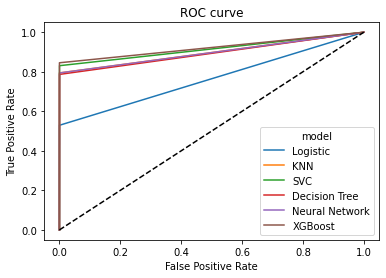

In [30]:
sns.lineplot(x='FPR', y='TPR', data=df_scores, hue='model')
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], 'k--')

In [31]:
def plot_confusion(TN, FP, FN, TP, title):
    confusion_mat = [[TN, FN], [FP, TP]]
    ax = sns.heatmap(confusion_mat, annot=True, fmt='d', cmap="YlGnBu", cbar=False)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title("Confusion Matrix \n" + title)
    ax.set_xticklabels(['No Fraud', 'Fraud'])
    ax.set_yticklabels(['No Fraud', 'Fraud'])
    return plt.show()

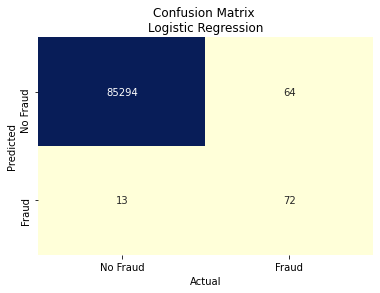

In [32]:
from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(y_test, log_reg_pred).ravel()
ac

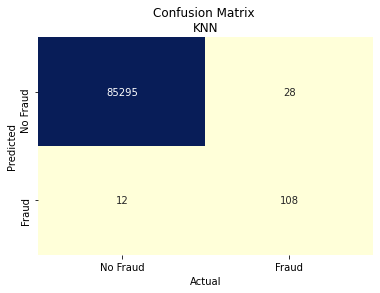

In [33]:
tn, fp, fn, tp = confusion_matrix(y_test, knears_pred).ravel()
plot_confusion(tn,fp,fn,tp, title='KNN')

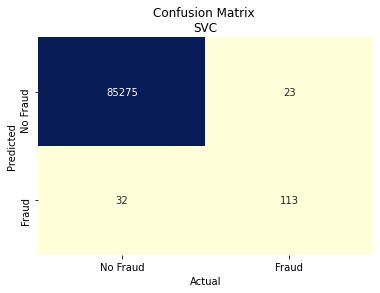

In [34]:
tn, fp, fn, tp = confusion_matrix(y_test, svc_pred).ravel()
plot_confusion(tn,fp,fn,tp, title='SVC')

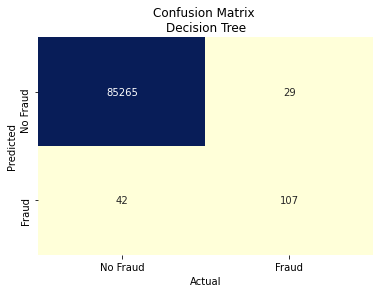

In [35]:
tn, fp, fn, tp = confusion_matrix(y_test, tree_pred).ravel()
plot_confusion(tn,fp,fn,tp, title='Decision Tree')

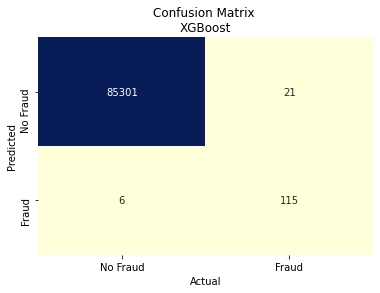

In [36]:
tn, fp, fn, tp = confusion_matrix(y_test, xgb_pred).ravel()
plot_confusion(tn,fp,fn,tp, title='XGBoost')

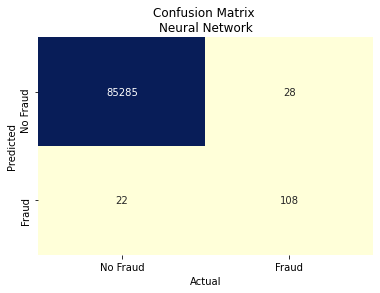

In [37]:
tn, fp, fn, tp = confusion_matrix(y_test, nn_pred).ravel()
plot_confusion(tn,fp,fn,tp, title='Neural Network')

In [ ]:
log_reg_pred = models['LogisiticRegression'].predict(X_test)
knears_pred = models['KNearest'].predict(X_test)
svc_pred = models['Support Vector Classifier'].predict(X_test)
tree_pred = models['DecisionTreeClassifier'].predict(X_test)
xgb_pred = xgb.predict(X_test)
nn_pred = nn.predict(X_test)

In [38]:
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score
def model_scores(model, title):
    y_pred = model.predict(X_train)
    print(title)
    print('Recall Score: {:.4f}%'.format(recall_score(y_train, y_pred)*100))
    print('Precision Score: {:.4f}%'.format(precision_score(y_train, y_pred)*100))
    print('F1 Score: {:.4f}%'.format(f1_score(y_train, y_pred)*100))
    print('Accuracy Score: {:.4f}%'.format(accuracy_score(y_train, y_pred)*100))

In [39]:
model_scores(models['LogisiticRegression'], 'Logistic Regression')

Logistic Regression
Recall Score: 53.3708%
Precision Score: 87.5576%
F1 Score: 66.3176%
Accuracy Score: 99.9032%


In [40]:
model_scores(models['KNearest'], 'KNN')

KNN
Recall Score: 78.9326%
Precision Score: 94.9324%
F1 Score: 86.1963%
Accuracy Score: 99.9549%


In [41]:
model_scores(models['Support Vector Classifier'], 'SVC')

SVC
Recall Score: 78.9326%
Precision Score: 85.1515%
F1 Score: 81.9242%
Accuracy Score: 99.9378%


In [42]:
model_scores(models['DecisionTreeClassifier'], 'Decision Tree')

Decision Tree
Recall Score: 100.0000%
Precision Score: 100.0000%
F1 Score: 100.0000%
Accuracy Score: 100.0000%


In [43]:
model_scores(xgb, 'XGBoost')

XGBoost
Recall Score: 100.0000%
Precision Score: 100.0000%
F1 Score: 100.0000%
Accuracy Score: 100.0000%


In [44]:
model_scores(nn, 'Neural Network')

C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


Neural Network
Recall Score: 77.8090%
Precision Score: 85.4938%
F1 Score: 81.4706%
Accuracy Score: 99.9368%


In [157]:
def model_scores_test(model, title):
    y_pred = model.predict(X_test)
    print(title)
    print('Recall Score: {:.4f}%'.format(recall_score(y_test, y_pred)*100))
    print('Precision Score: {:.4f}%'.format(precision_score(y_test, y_pred)*100))
    print('F1 Score: {:.4f}%'.format(f1_score(y_test, y_pred)*100))
    print('Accuracy Score: {:.4f}%'.format(accuracy_score(y_test, y_pred)*100))

In [158]:
model_scores_test(models['LogisiticRegression'], 'Logistic Regression')

Logistic Regression
Recall Score: 52.9412%
Precision Score: 84.7059%
F1 Score: 65.1584%
Accuracy Score: 99.9099%


In [159]:
model_scores_test(models['KNearest'], 'KNN')

KNN
Recall Score: 79.4118%
Precision Score: 90.0000%
F1 Score: 84.3750%
Accuracy Score: 99.9532%


In [160]:
model_scores_test(models['Support Vector Classifier'], 'SVC')

SVC
Recall Score: 83.0882%
Precision Score: 77.9310%
F1 Score: 80.4270%
Accuracy Score: 99.9356%


In [161]:
model_scores_test(models['DecisionTreeClassifier'], 'Decision Tree')

Decision Tree
Recall Score: 77.2059%
Precision Score: 75.0000%
F1 Score: 76.0870%
Accuracy Score: 99.9228%


In [162]:
model_scores_test(xgb, 'XGBoost')

XGBoost
Recall Score: 84.5588%
Precision Score: 95.0413%
F1 Score: 89.4942%
Accuracy Score: 99.9684%


In [163]:
model_scores_test(nn, 'Neural Network')

C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



Neural Network
Recall Score: 74.2647%
Precision Score: 84.8739%
F1 Score: 79.2157%
Accuracy Score: 99.9380%
